<img align="left" src = https://project.lsst.org/sites/default/files/Rubin-O-Logo_0.png width=250 style="padding: 10px"> 
<br>
<b>HSC Cosmos Analysis Notebook</b> <br>
Contact author: Erin Howard<br>
Last verified to run: November 29, 2022<br>
LSST Science Piplines version: w_2022_39<br>
Container Size: Large <br>

# DM-36025: ApPipeWithFakes on HSC COSMOS, October 2022

New baseline run, still using "old diffim" (before the big refactor).

* Working directory on USDF with bps logs, pipelines, etc. is `/sdf/group/rubin/user/smart/test_data/apdb_test`
* Templates are in `u/mrawls/DM-34711/templates`
* Final processing of HSC COSMOS is in `u/smart/DM-36389/hsc-output-collection`
* Postgres schema is `smart_dm36389_hsc_fakes_rerun`

For ApPipeWithFakes.yaml:
```
inCollection: u/mrawls/DM-34711/templates,HSC/raw/RC2/9813,HSC/calib,HSC/masks,refcats,skymaps
dataQuery: "instrument='HSC' AND skymap='hsc_rings_v1' AND band IN ('g', 'r', 'i', 'z', 'y')"
```

## Table of Contents

1. Loading DiaObjects and DiaSources
2. Typical "quick look analysis" plots
3. Separating the fake sources from the real sources
4. Fakes completeness analysis
5. SNR distributions

In [1]:
%matplotlib widget

import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as plticker
import importlib
import pandas as pd

from astropy.coordinates import SkyCoord
import astropy.units as u

import lsst.geom
import lsst.daf.butler as dafButler
from lsst.ap.association import UnpackApdbFlags, TransformDiaSourceCatalogConfig
from lsst.analysis.ap import legacyApdbUtils as utils
from lsst.analysis.ap import legacyCoaddAnalysis
from lsst.analysis.ap import legacyPlotUtils as plac

import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

importlib.reload(utils)

Overriding default configuration file with /opt/lsst/software/stack/stack/miniconda3-py38_4.9.2-5.0.0/Linux64/dustmaps_cachedata/g41a3ec361e+62d12e78cb/config/.dustmapsrc


<module 'lsst.analysis.ap.legacyApdbUtils' from '/sdf/data/rubin/u/elhoward/repos/analysis_ap/python/lsst/analysis/ap/legacyApdbUtils.py'>

## 1. Loading DiaObjects and DiaSources

In [2]:
repo = '/repo/main'
butler = dafButler.Butler(repo)
collections = 'u/smart/DM-36389/hsc-output-collection'
instrument = 'HSC'
skymap = 'hsc_rings_v1'
schema = 'smart_dm36389_hsc_fakes_rerun'

dbType='postgres'
dbName='lsst-devl'

month = 'October'
year = '2022'

In [3]:
objTable, srcTable, goodObj, goodSrc = utils.loadTables(repo,
                                                      dbName=dbName,
                                                      dbType=dbType,
                                                      instrument=instrument,
                                                      schema=schema)

In [4]:
flagTable, srcTableFlags, flagFilter, goodSrc, goodObj = utils.makeSrcTableFlags(srcTable, objTable,
                                                                                 instrument=instrument,
                                                                                 repo=repo)

In [5]:
objTable.columns

Index(['diaObjectId', 'ra', 'decl', 'nDiaSources', 'gPSFluxMean',
       'rPSFluxMean', 'iPSFluxMean', 'zPSFluxMean', 'yPSFluxMean',
       'validityEnd', 'flags'],
      dtype='object')

In [6]:
srcTable.columns

Index(['diaSourceId', 'diaObjectId', 'ra', 'decl', 'ccdVisitId', 'midPointTai',
       'apFlux', 'psFlux', 'apFluxErr', 'psFluxErr', 'totFlux', 'totFluxErr',
       'x', 'y', 'snr', 'ixxPSF', 'iyyPSF', 'ixyPSF', 'flags', 'filterName',
       'visit', 'detector', 'instrument'],
      dtype='object')

## 2. Typical "quick look analysis" plots

Including a visual comparison of an older August 2022 processing run.

In [7]:
xlim = (151.05, 149.40)
ylim = (1.45, 3.03)

Text(0.5, 1.0, 'All DIA Objects, October 2022')

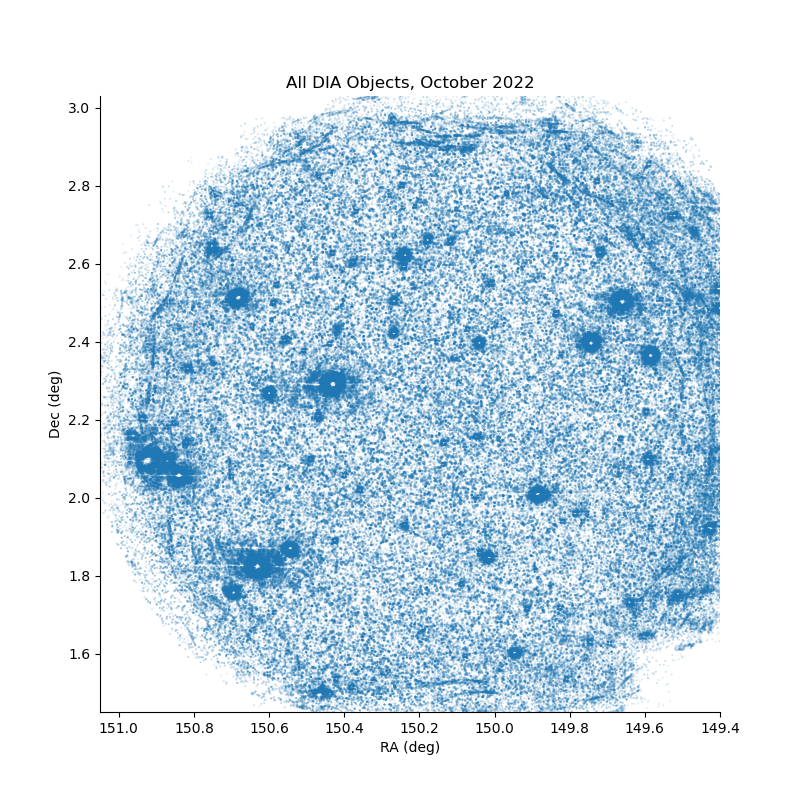

In [8]:
fig = plt.figure(figsize=(8,8))

cutoff = 0  # only plot DIA Objects composed of cutoff or more DIA Sources

ax = fig.add_subplot(111)
plt.setp(ax, xlim=xlim, ylim=ylim)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.scatter(goodObj.loc[goodObj['nDiaSources'] > cutoff, 'ra'], goodObj.loc[goodObj['nDiaSources'] > cutoff, 'decl'], 
           c='C0', s=goodObj.loc[goodObj['nDiaSources'] > cutoff, 'nDiaSources']/10, marker='.', alpha=0.4)
ax.set_xlabel('RA (deg)')
ax.set_ylabel('Dec (deg)')
ax.set_title(f'All DIA Objects, {month} {year}')

Text(0.5, 1.0, 'DIA Objects composed of > 3 "Good" DIA Sources, October 2022')

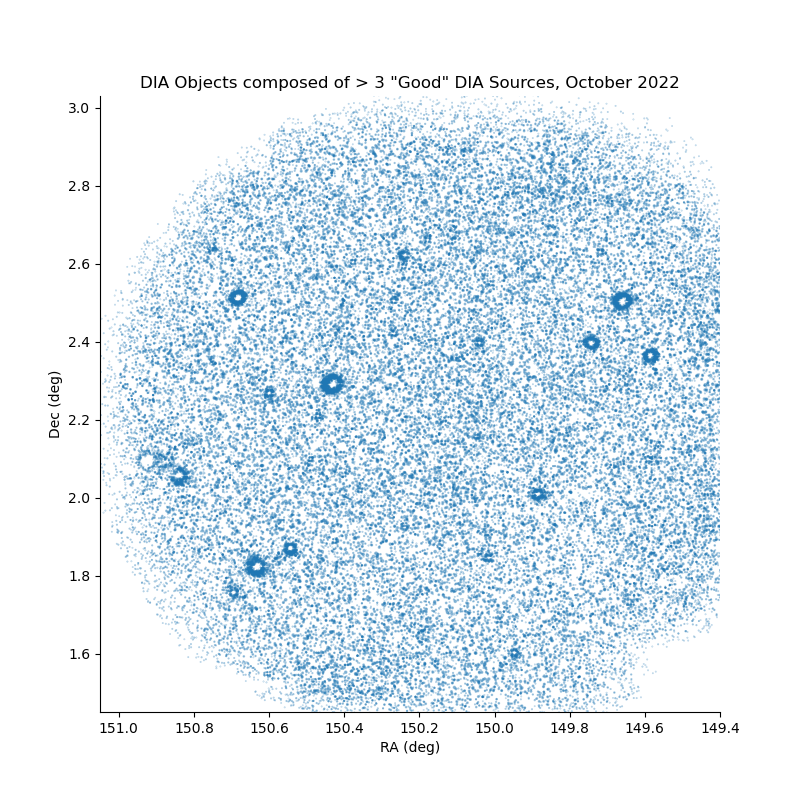

In [9]:
fig = plt.figure(figsize=(8,8))

cutoff = 3  # only plot DIA Objects composed of cutoff or more DIA Sources

ax = fig.add_subplot(111)
plt.setp(ax, xlim=xlim, ylim=ylim)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.scatter(goodObj.loc[goodObj['nDiaSources'] > cutoff, 'ra'], goodObj.loc[goodObj['nDiaSources'] > cutoff, 'decl'], 
           c='C0', s=goodObj.loc[goodObj['nDiaSources'] > cutoff, 'nDiaSources']/10, marker='.', alpha=0.4)
ax.set_xlabel('RA (deg)')
ax.set_ylabel('Dec (deg)')
ax.set_title(f'DIA Objects composed of > {cutoff} "Good" DIA Sources, {month} {year}')

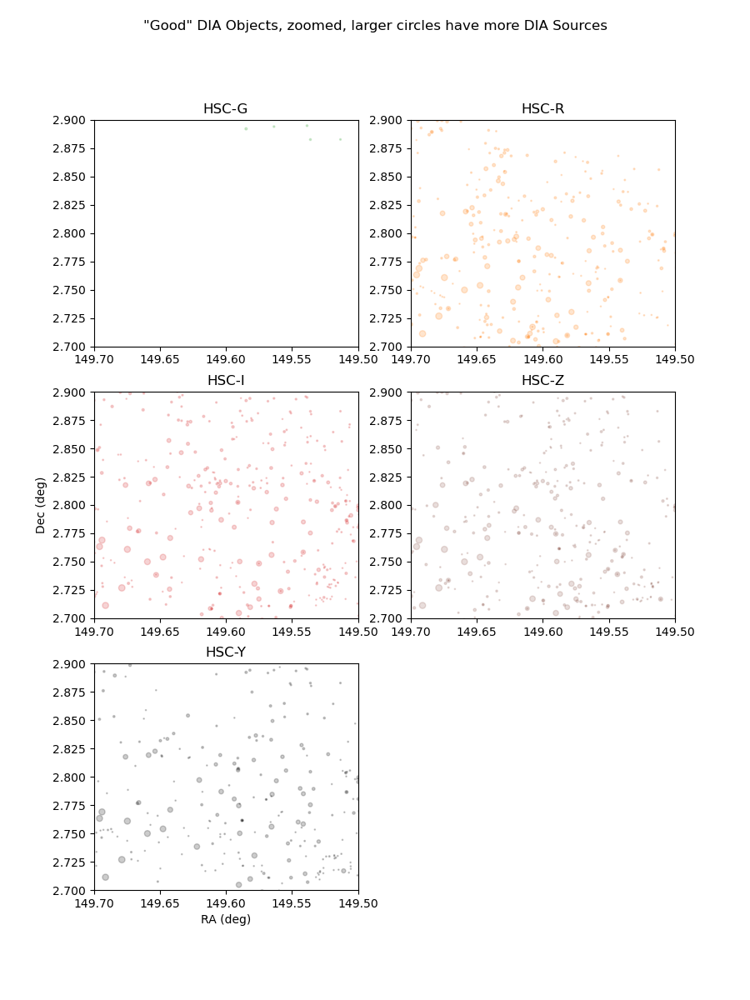

In [10]:
fig, axs = plt.subplots(3, 2, figsize=(9, 12))

fig.suptitle('"Good" DIA Objects, zoomed, larger circles have more DIA Sources')

nSrc = 2  # threshold for which DIA Objects to plot (only those with > nSrc constituent DIA Sources)

axG = axs[0, 0]
axR = axs[0, 1]
axI = axs[1, 0]
axZ = axs[1, 1]
axY = axs[2, 0]

ax0 = axs[2, 1]
ax0.axis('off')

axList = [axG, axR, axI, axZ, axY]

xlim = [149.7, 149.5]
ylim = [2.7, 2.9]
plt.setp(axs, xlim=xlim, ylim=ylim)

goodGFilter = (goodObj['nDiaSources'] > nSrc) & (goodObj['gPSFluxMean'] > 0)
goodRFilter = (goodObj['nDiaSources'] > nSrc) & (goodObj['rPSFluxMean'] > 0)
goodIFilter = (goodObj['nDiaSources'] > nSrc) & (goodObj['iPSFluxMean'] > 0)
goodZFilter = (goodObj['nDiaSources'] > nSrc) & (goodObj['zPSFluxMean'] > 0)
goodYFilter = (goodObj['nDiaSources'] > nSrc) & (goodObj['yPSFluxMean'] > 0)

goodFilterList = [goodGFilter, goodRFilter, goodIFilter, goodZFilter, goodYFilter]

axY.set_xlabel('RA (deg)')
axI.set_ylabel('Dec (deg)')

axG.set_title('HSC-G')
axR.set_title('HSC-R')
axI.set_title('HSC-I')
axZ.set_title('HSC-Z')
axY.set_title('HSC-Y')

colorList = ['C2', 'C1', 'C3', 'C5', 'k']

for ax, goodFilter, color in zip(axList, goodFilterList, colorList):
    ax.scatter(goodObj.loc[goodFilter, 'ra'],
               goodObj.loc[goodFilter, 'decl'],
               s=goodObj.loc[goodFilter, 'nDiaSources'], c=color, marker='.', alpha=0.2)

Text(0.5, 1.0, 'HSC-Y')

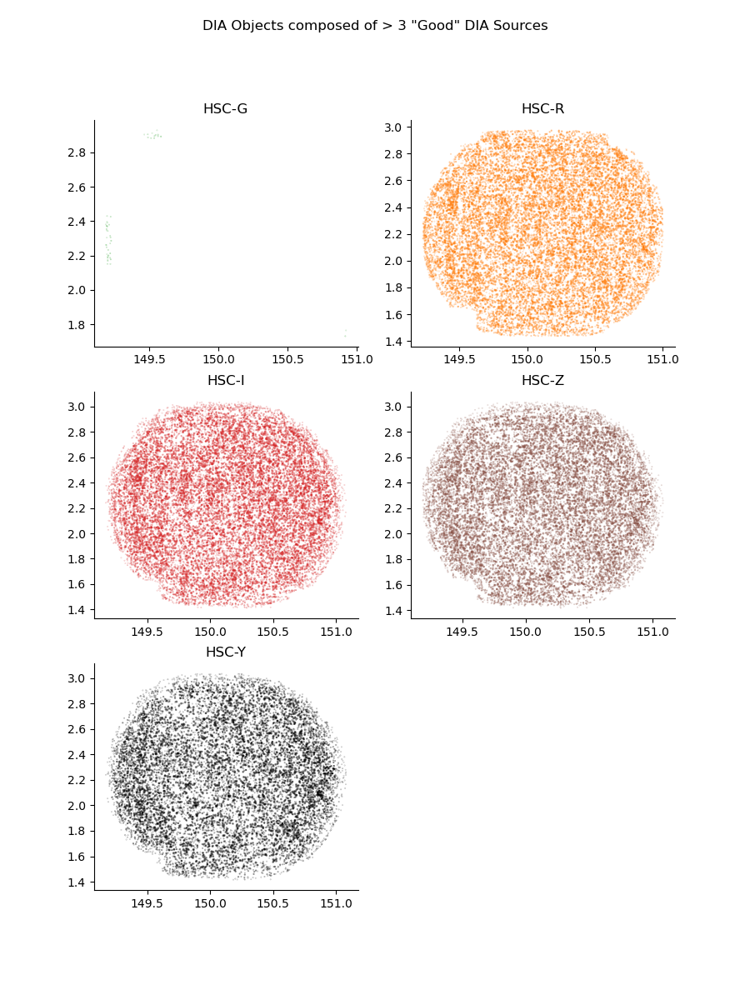

In [11]:
fig, axs = plt.subplots(3, 2, figsize=(9, 12))

axG = axs[0, 0]
axR = axs[0, 1]
axI = axs[1, 0]
axZ = axs[1, 1]
axY = axs[2, 0]
#axHits = axs[2, 1]

ax0 = axs[2, 1]
ax0.axis('off')

axList = [axG, axR, axI, axZ, axY]
colorList = ['C2', 'C1', 'C3', 'C5', 'k']

### DIA OBJECTS ###

nSrc = 3  # threshold for which DIA Objects to plot (only those with > nSrc constituent DIA Sources)
fig.suptitle(f'DIA Objects composed of > {nSrc} "Good" DIA Sources')

goodGFilter = (goodObj['nDiaSources'] > nSrc) & (goodObj['gPSFluxMean'] > 0)
goodRFilter = (goodObj['nDiaSources'] > nSrc) & (goodObj['rPSFluxMean'] > 0)
goodIFilter = (goodObj['nDiaSources'] > nSrc) & (goodObj['iPSFluxMean'] > 0)
goodZFilter = (goodObj['nDiaSources'] > nSrc) & (goodObj['zPSFluxMean'] > 0)
goodYFilter = (goodObj['nDiaSources'] > nSrc) & (goodObj['yPSFluxMean'] > 0)

filterList = [goodGFilter, goodRFilter, goodIFilter, goodZFilter, goodYFilter]

for ax, filtered, color in zip(axList, filterList, colorList):
    ax.scatter(goodObj.loc[filtered, 'ra'], goodObj.loc[filtered, 'decl'], c=color, marker='.', alpha=0.4,
               s=goodObj.loc[(goodObj['nDiaSources'] > cutoff) & (filtered), 'nDiaSources']/20)

for ax in axList:
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

axG.set_title('HSC-G')
axR.set_title('HSC-R')
axI.set_title('HSC-I')
axZ.set_title('HSC-Z')
axY.set_title('HSC-Y')

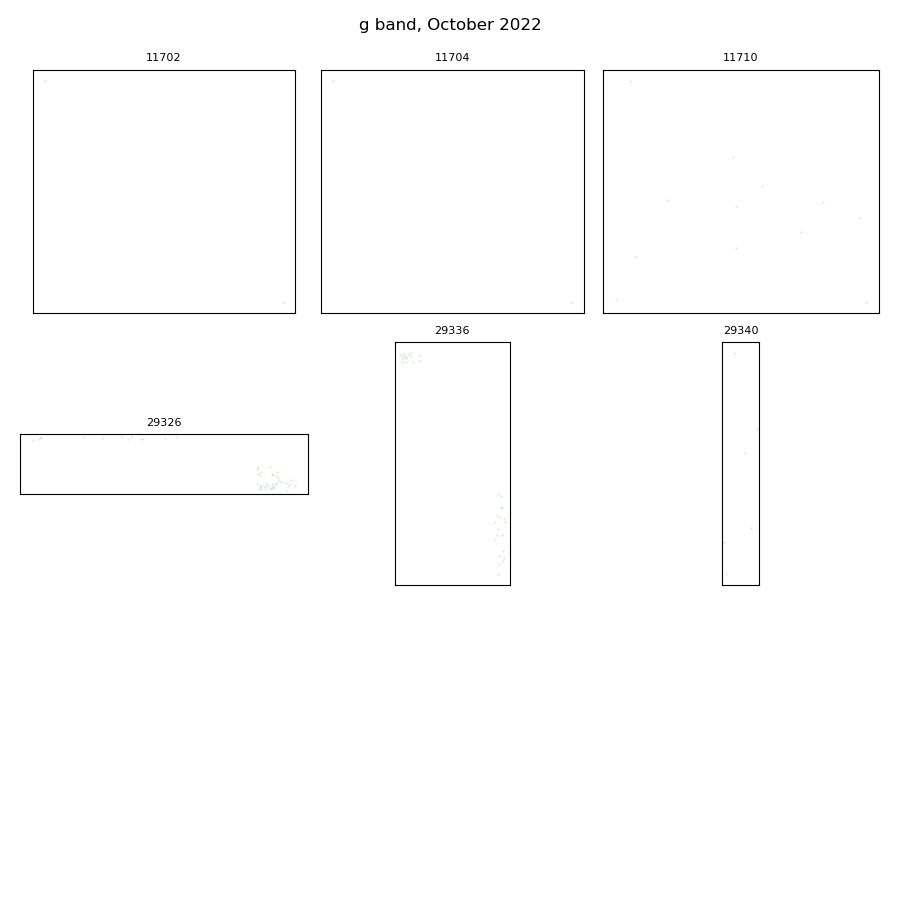

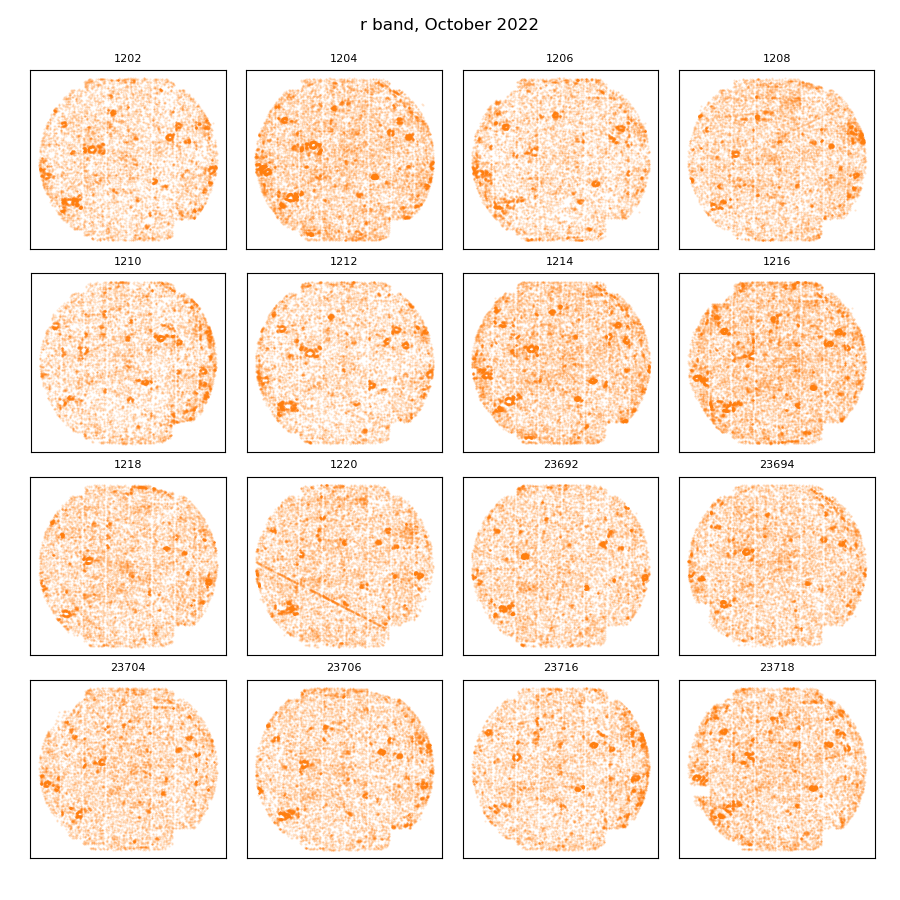

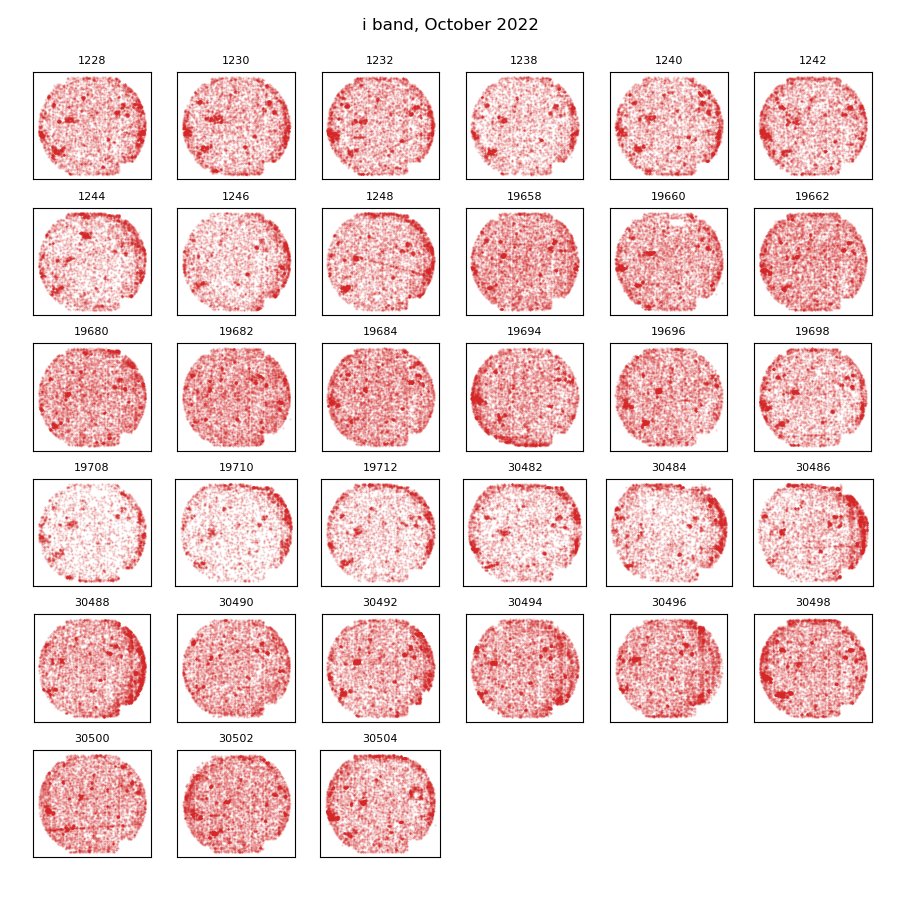

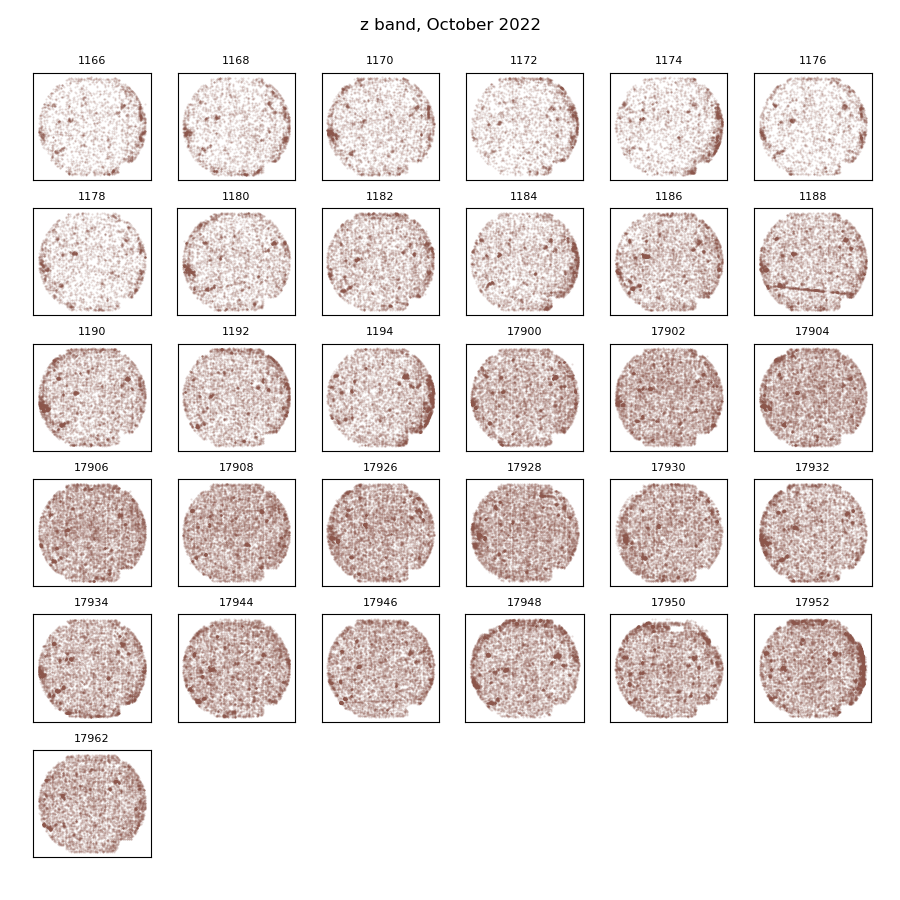

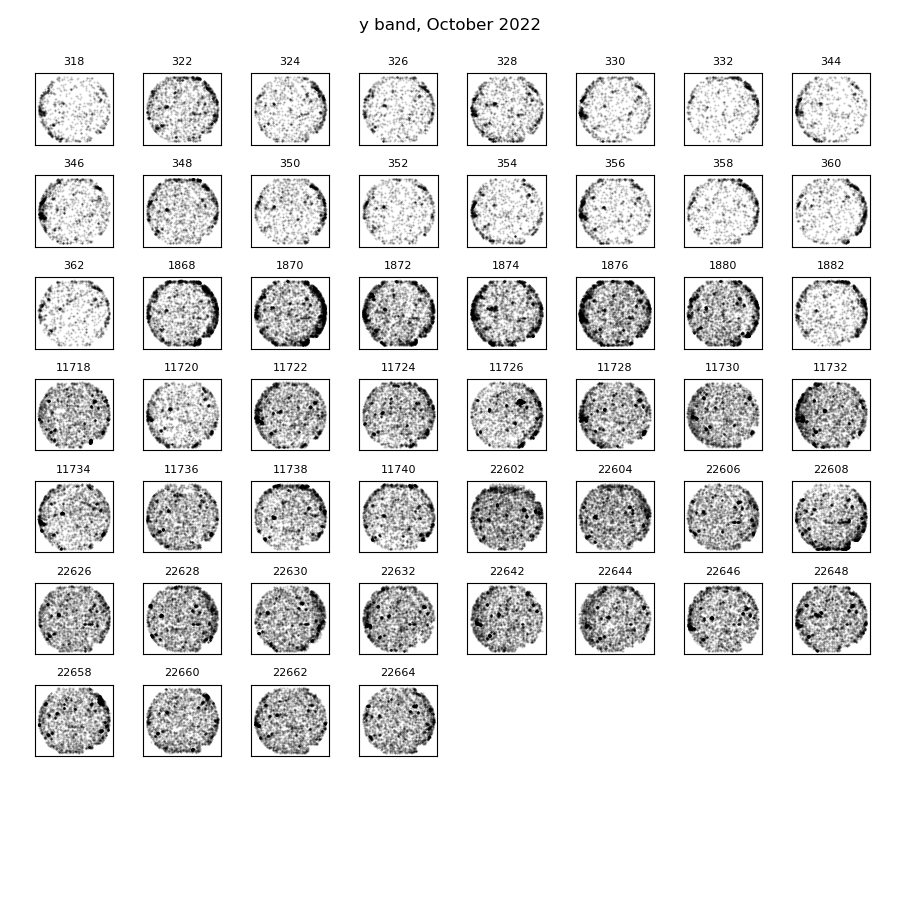

In [12]:
# Note: g band data per visit is sparse
bandList = ['g', 'r', 'i', 'z', 'y']
colorList = ['C2', 'C1', 'C3', 'C5', 'k']
size=1

for band, color in zip(bandList, colorList):
    plac.plotDiaSourcesOnSkyGrid(repo, goodSrc.loc[goodSrc['filterName'] == band], title=band+f' band, {month} {year}', color=color, size=size)

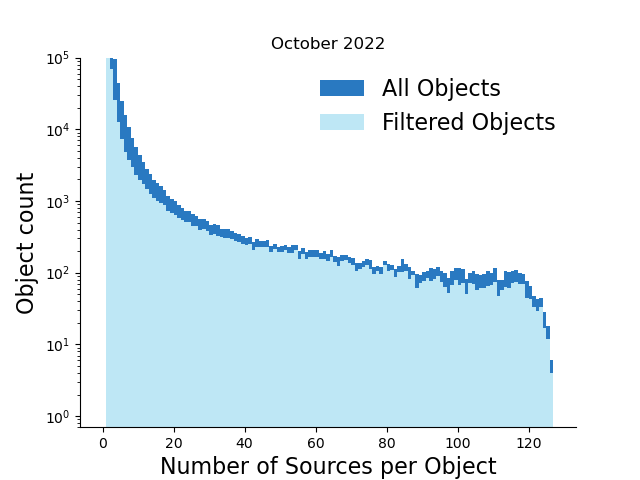

In [13]:
hist = plac.plotDiaObjectHistogram(objTable, goodObj, title=f'{month} {year}')

Text(0.5, 1.0, 'DIA Object and DIA Source counts. October 2022')

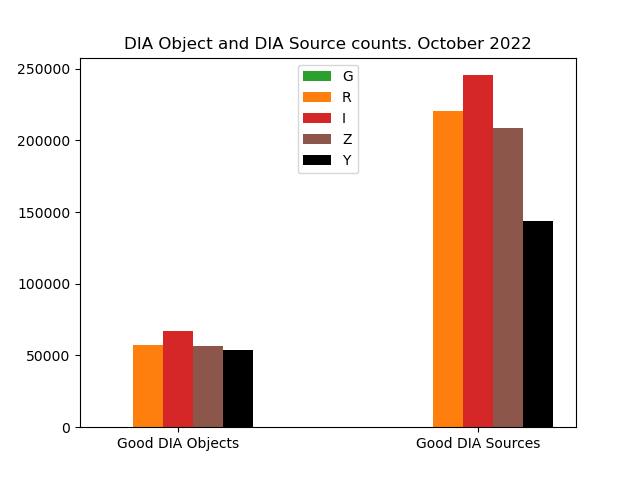

In [14]:
fig, ax = plt.subplots()
barLabels = ['Good DIA Objects', 'Good DIA Sources']
xbar = np.array([0, 1])
width = 0.2

#hitsObjCompare = (goodObjHits['decl'] > 0)
#hitsSrcCompare = (goodSrcHits['decl'] > 0)

goodObjG = goodObj.loc[goodObj['gPSFluxMean'] > 0]
goodObjR = goodObj.loc[goodObj['rPSFluxMean'] > 0]
goodObjI = goodObj.loc[goodObj['iPSFluxMean'] > 0]
goodObjZ = goodObj.loc[goodObj['zPSFluxMean'] > 0]
goodObjY = goodObj.loc[goodObj['yPSFluxMean'] > 0]

goodSrcG = goodSrc.loc[goodSrc['filterName'] == 'g']
goodSrcR = goodSrc.loc[goodSrc['filterName'] == 'r']
goodSrcI = goodSrc.loc[goodSrc['filterName'] == 'i']
goodSrcZ = goodSrc.loc[goodSrc['filterName'] == 'z']
goodSrcY = goodSrc.loc[goodSrc['filterName'] == 'y']

ax.bar(xbar - width, [len(goodObjG), len(goodSrcG)], width/2, label='G', color='C2')
ax.bar(xbar - width/2, [len(goodObjR), len(goodSrcR)], width/2, label='R', color='C1')
ax.bar(xbar, [len(goodObjI), len(goodSrcI)], width/2, label='I', color='C3')
ax.bar(xbar + width/2, [len(goodObjZ), len(goodSrcZ)], width/2, label='Z', color='C5')
ax.bar(xbar + width, [len(goodObjY), len(goodSrcY)], width/2, label='Y', color='k')
#ax.bar(xbar + width + width/2, [len(goodObjHits[hitsObjCompare]), len(goodSrcHits[hitsSrcCompare])],
#       width/2, label='HiTS', color='C0')

plt.legend(loc='upper center')
ax.set_xticks([0, 1])
labels = ax.set_xticklabels(barLabels)
plt.title(f'DIA Object and DIA Source counts. {month} {year}')

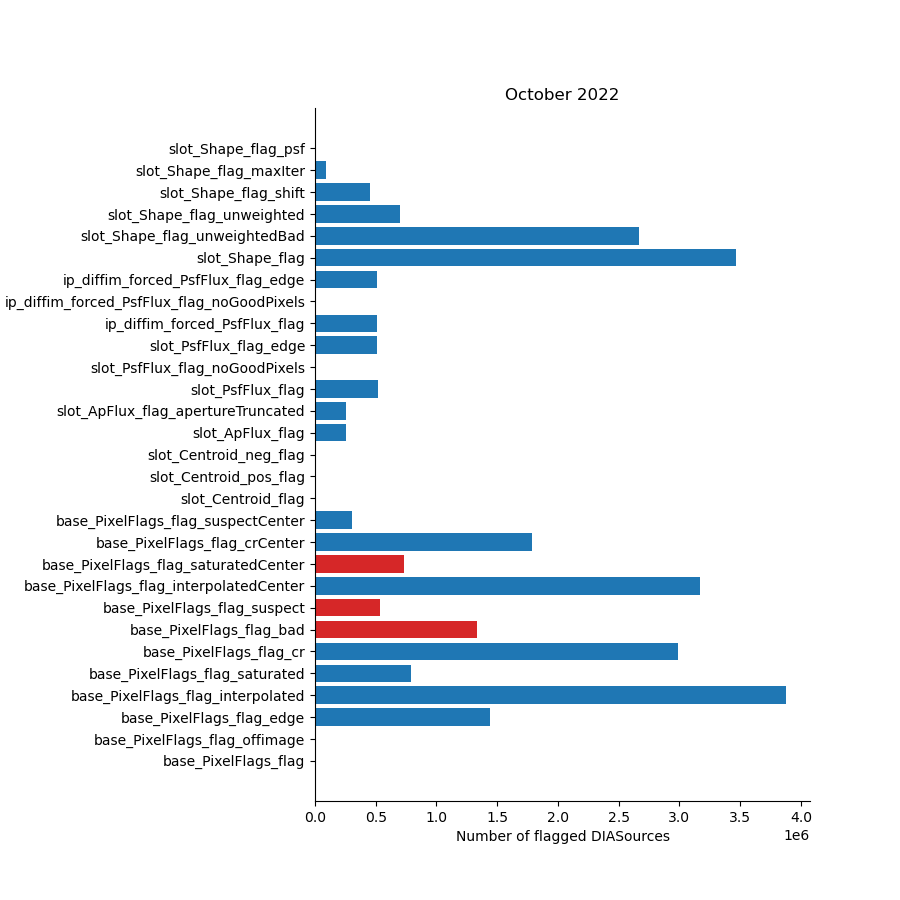

In [15]:
plac.plotFlagHist(srcTable, title=f'{month} {year}')

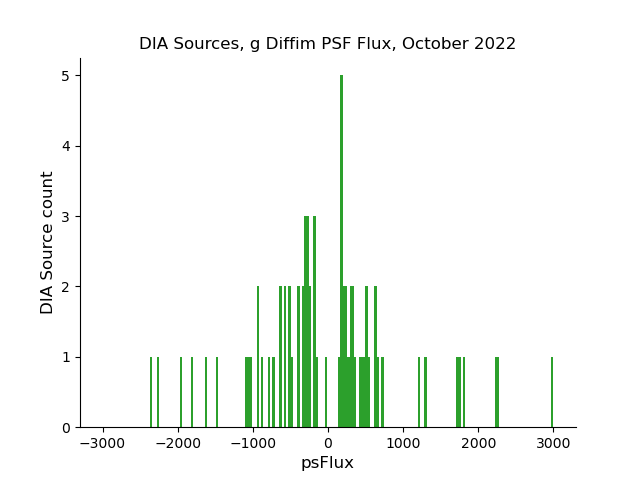

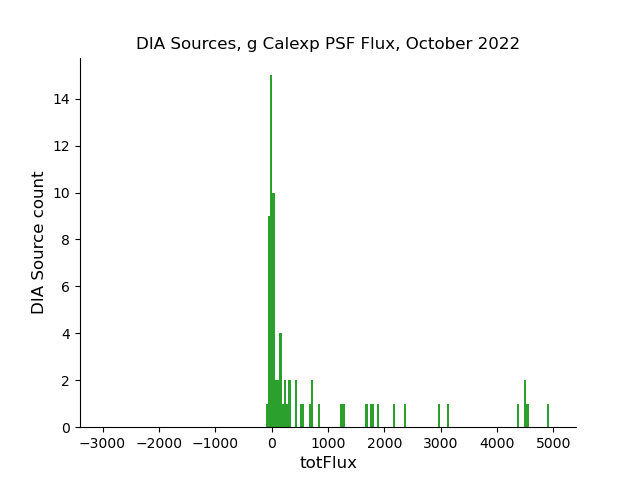

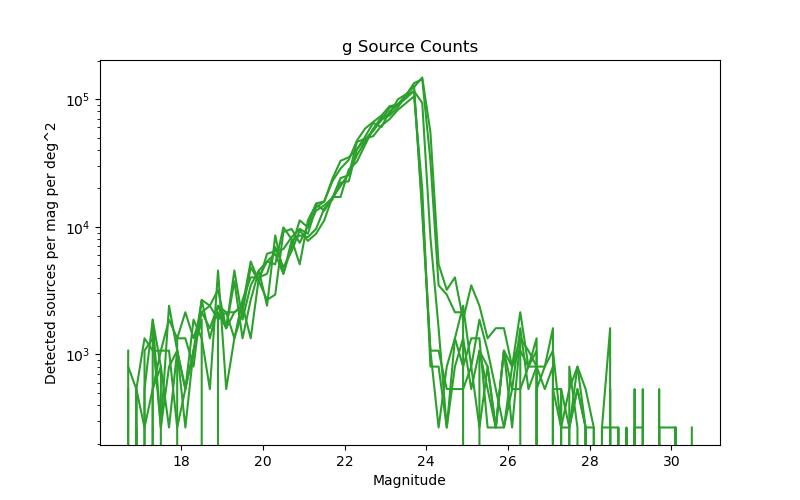

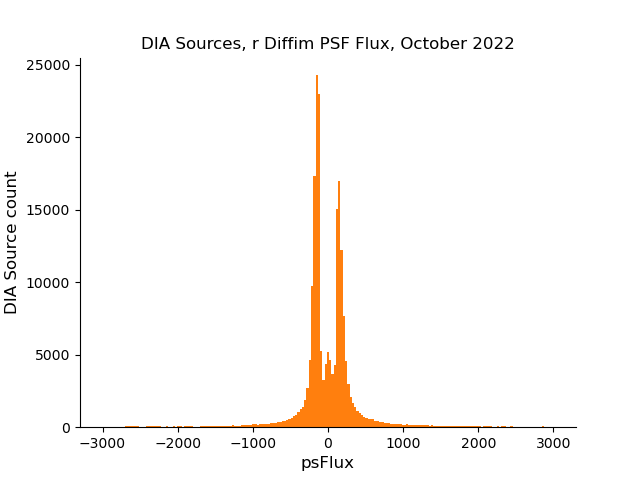

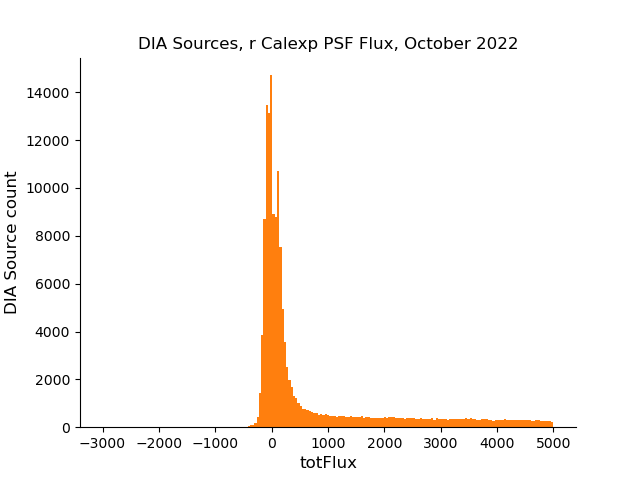

...

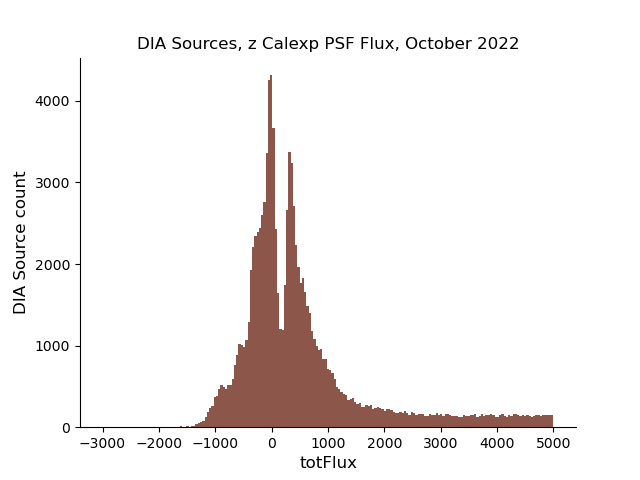

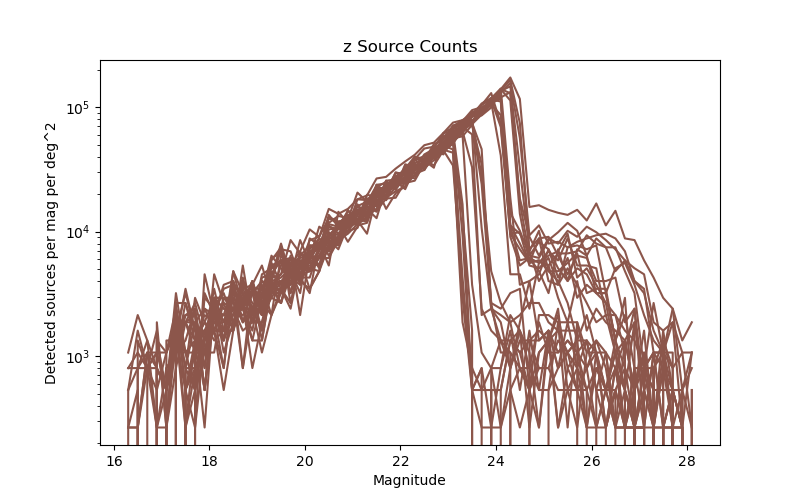

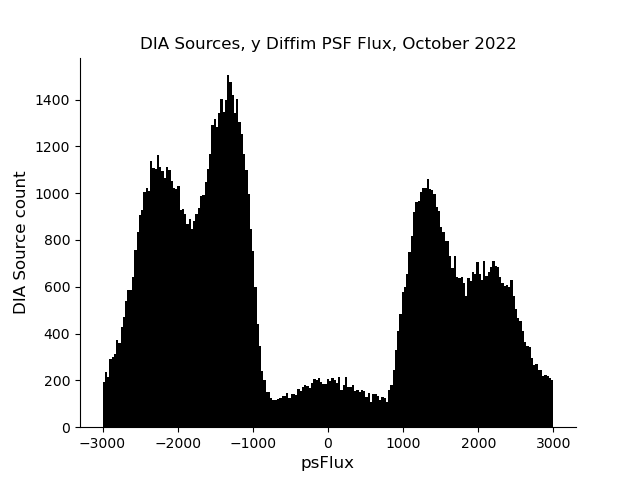

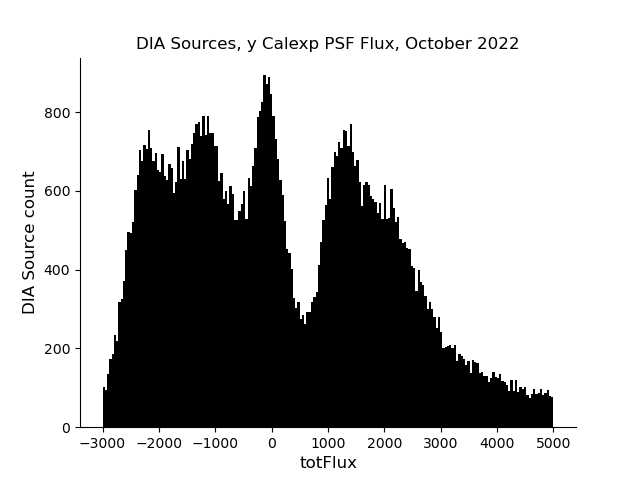

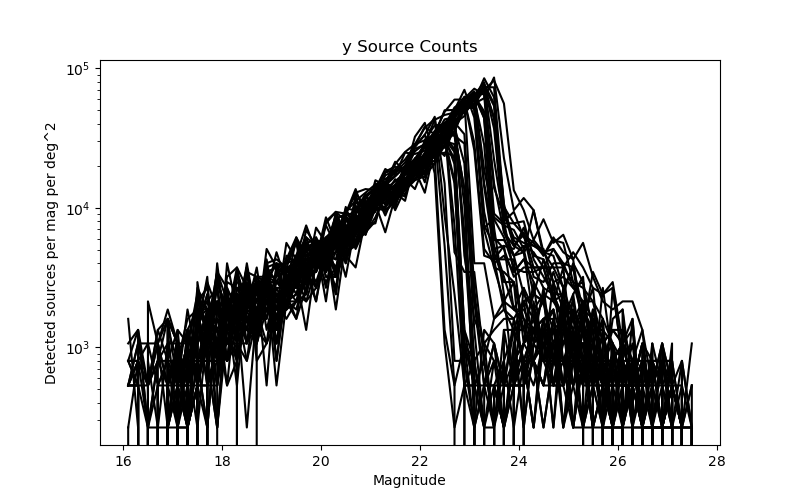

In [16]:
collection = collections

for band, color in zip(bandList, colorList):
    plac.plotFluxHistSrc(goodSrc.loc[goodSrc['filterName'] == band], fluxType='psFlux',
                        title=f'DIA Sources, {band} Diffim PSF Flux, {month} {year}', color1=color, binmin=-3e3, binmax=3e3)
    plac.plotFluxHistSrc(goodSrc.loc[goodSrc['filterName'] == band], fluxType='totFlux',
                        title=f'DIA Sources, {band} Calexp PSF Flux, {month} {year}', color1=color, binmin=-3e3, binmax=5e3)
    plac.source_magnitude_histogram(repo, goodSrc, band, 'HSC', collection)

## 3. Separating the fake sources from the real sources

In [17]:
tractList = [9813]
dfs = [butler.get('fakes_fakeSourceCat', collections=collections,
                 instrument=instrument, skymap=skymap, tract=tract) for tract in tractList]
allInjectedFakes = pd.concat(dfs, ignore_index=True)

In [18]:
allInjectedFakes

,fakeId,dec,ra,isVisitSource,isTemplateSource,u_mag,g_mag,r_mag,i_mag,z_mag,y_mag,disk_semimajor,bulge_semimajor,disk_n,bulge_n,disk_axis_ratio,bulge_axis_ratio,disk_pa,bulge_pa,sourceType
0,10920830937487914800,0.030411,2.621597,True,False,25.160898,25.160898,25.160898,25.160898,25.160898,25.160898,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,star
1,13569872331211144118,0.034815,2.621040,True,False,20.642687,20.642687,20.642687,20.642687,20.642687,20.642687,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,star
2,12826677421104597864,0.042081,2.603423,True,False,23.876662,23.876662,23.876662,23.876662,23.876662,23.876662,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,star
3,11716034744241672197,0.040334,2.636729,True,False,25.118767,25.118767,25.118767,25.118767,25.118767,25.118767,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,star
4,13029769525444204892,0.033896,2.629257,True,False,23.367207,23.367207,23.367207,23.367207,23.367207,23.367207,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,star
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8858,10105142270488017651,0.043717,2.610436,False,True,20.013189,20.013189,20.013189,20.013189,20.013189,20.013189,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,star
8859,13661923784833522911,0.055644,2.621685,False,True,21.096544,21.096544,21.096544,21.096544,21.096544,21.096544,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,star
8860,11373056617227678626,0.040447,2.606848,False,True,24.345681,24.345681,24.345681,24.345681,24.345681,24.345681,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,star
8861,11723261768524260601,0.036272,2.603944,False,True,23.850171,23.850171,23.850171,23.850171,23.850171,23.850171,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,star


In [19]:
def collectMatchedDiaSources(fakesMatchDiaSrc, maxi=-1):
    """Given a butler query of fakesMatchDiaSrc datasetRefs, create a pandas dataframe with them all.
    'All' is defined as up to maxi of them, so it doesn't take forever.
    
    If you really want all of them, set maxi to -1.
    """
    #%%time
    visitDetectorFrames = []

    i = 0

    for datasetRef in fakesMatchDiaSrc: 
        try:
            frame = butler.getDirect(datasetRef)
            # nondetected sources don't have DIASource records--so propagate metadata to all rows
            # grab a detected row
            w = frame['diaSourceId'] > 0
            if np.sum(w) == 0:
                print(f'No real sources detected in {datasetRef}')
                continue
            ccdVisitId = int(frame.loc[w,'ccdVisitId'].iloc[0])
            filterName = frame.loc[w,'filterName'].iloc[0]
            # propagate to all rows
            frame.loc[:,'ccdVisitId'] = ccdVisitId 
            frame.loc[:,'filterName'] = filterName 
        except Exception as e:
            raise(e)
        else:
            visitDetectorFrames.append(frame)
        i+=1
        if i == maxi:
            break

    matchedDiaSources = pd.concat(visitDetectorFrames)

    matchedDiaSources.loc[:,'ra'] = np.degrees(matchedDiaSources['ra_x'])
    matchedDiaSources.loc[:,'decl'] = np.degrees(matchedDiaSources['dec'])

    return matchedDiaSources

In [20]:
fakesMatchDiaSrc = butler.registry.queryDatasets(collections=collections,
                                                 datasetType='fakes_goodSeeingDiff_matchDiaSrc')
matchedDiaSources = collectMatchedDiaSources(fakesMatchDiaSrc)

No real sources detected in fakes_goodSeeingDiff_matchDiaSrc@{instrument: 'HSC', detector: 69, visit: 29340, ...}, sc=DataFrame] (id=5c1ac727-faf3-41a2-88a6-51a626e12ff8)


In [21]:
instrumentDataId = butler.registry.expandDataId(instrument=instrument)
packer = butler.registry.dimensions.makePacker("visit_detector", instrumentDataId)
dataId = packer.unpack(matchedDiaSources.ccdVisitId)
matchedDiaSources['visit'] = dataId['visit']
matchedDiaSources['detector'] = dataId['detector']

In [22]:
matchedDiaSources

,fakeId,dec,ra_x,isVisitSource,isTemplateSource,u_mag,g_mag,r_mag,i_mag,z_mag,...,totFluxErr,ixx,iyy,ixy,ixxPSF,iyyPSF,ixyPSF,ra,visit,detector
0,12789029066185790010,0.033784,2.630212,True,False,23.192722,23.192722,23.192722,23.192722,23.192722,...,321.427781,0.134798,0.124476,0.040528,0.182945,-0.002448,-0.002448,150.700020,322,22
1,11127304561673245344,0.034719,2.632307,True,False,24.689494,24.689494,24.689494,24.689494,24.689494,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,150.820108,322,22
2,10362742525009068333,0.034909,2.632336,True,False,23.470640,23.470640,23.470640,23.470640,23.470640,...,353.922349,0.156357,0.056779,-0.085648,0.175770,-0.002352,-0.002352,150.821718,322,22
3,12100914011920081109,0.033327,2.631200,True,False,24.944083,24.944083,24.944083,24.944083,24.944083,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,150.756656,322,22
4,9405677420666839937,0.034820,2.632794,True,False,23.199932,23.199932,23.199932,23.199932,23.199932,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,150.847966,322,22
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28,12259502022782366910,0.044818,2.617517,False,True,23.234029,23.234029,23.234029,-23.234029,23.234029,...,40.661326,NaN,NaN,NaN,0.066243,-0.000039,-0.000039,149.972695,19660,81
29,12652059517664214462,0.044107,2.619152,False,True,21.187205,21.187205,21.187205,-21.187205,21.187205,...,39.934448,NaN,NaN,NaN,0.067063,-0.000039,-0.000039,150.066345,19660,81
30,9474855794416080264,0.045276,2.617815,False,True,25.056584,25.056584,25.056584,-25.056584,25.056584,...,40.454060,NaN,NaN,NaN,0.066042,-0.000038,-0.000038,149.989751,19660,81
31,11969890281448942404,0.044119,2.618589,False,True,21.810074,21.810074,21.810074,-21.810074,21.810074,...,39.462238,NaN,NaN,NaN,0.066948,-0.000039,-0.000039,150.034100,19660,81


Text(0.5, 1.0, 'DIA Objects, Fakes, and Matched DIA Sources, October 2022')

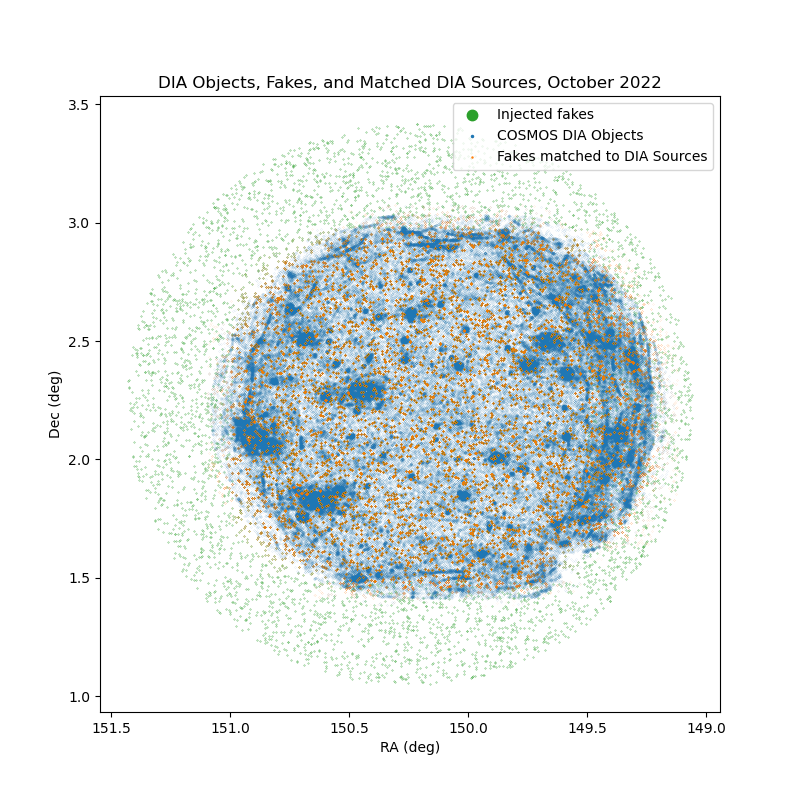

In [23]:
plt.figure(figsize=(8,8))
plt.plot(allInjectedFakes.ra*u.rad.to(u.deg), allInjectedFakes.dec*u.rad.to(u.deg),
         ls='None', marker='.', ms=0.5, label="Injected fakes", color='C2')
plt.plot(goodObj.ra, goodObj.decl, ls='None', marker='.', ms=0.1, label="COSMOS DIA Objects", color='C0')
plt.plot(matchedDiaSources.ra_x*u.rad.to(u.deg), matchedDiaSources.dec*u.rad.to(u.deg), ls='None', marker='.',
         ms=0.05, label="Fakes matched to DIA Sources", color='C1')
plt.gca().invert_xaxis()
plt.xlabel("RA (deg)")
plt.ylabel("Dec (deg)")
plt.legend(markerscale=30)
plt.title(f'DIA Objects, Fakes, and Matched DIA Sources, {month} {year}')

In [24]:
nFakesGood = len(matchedDiaSources)
nFakesGood  # number of matched fake sources

477091

In [25]:
len(srcTable) - nFakesGood  # number of non-fake DIA Sources

4500871

In [26]:
len(goodSrc)  # number of good sources

818648

visit 318: 18628 DIA Sources, 3655 matched injected fakes
visit 322: 22297 DIA Sources, 3639 matched injected fakes
visit 324: 19250 DIA Sources, 3632 matched injected fakes
visit 326: 19561 DIA Sources, 3602 matched injected fakes
visit 328: 21429 DIA Sources, 3618 matched injected fakes
visit 330: 20009 DIA Sources, 3565 matched injected fakes
visit 332: 18312 DIA Sources, 3627 matched injected fakes
visit 344: 18786 DIA Sources, 3622 matched injected fakes
visit 346: 20095 DIA Sources, 3581 matched injected fakes
visit 348: 21989 DIA Sources, 3690 matched injected fakes
visit 350: 19994 DIA Sources, 3638 matched injected fakes
visit 352: 19819 DIA Sources, 3636 matched injected fakes
visit 354: 20558 DIA Sources, 3685 matched injected fakes
visit 356: 20614 DIA Sources, 3621 matched injected fakes
visit 358: 19491 DIA Sources, 3622 matched injected fakes
visit 360: 19464 DIA Sources, 3611 matched injected fakes
visit 362: 20011 DIA Sources, 3614 matched injected fakes
visit 1166: 22

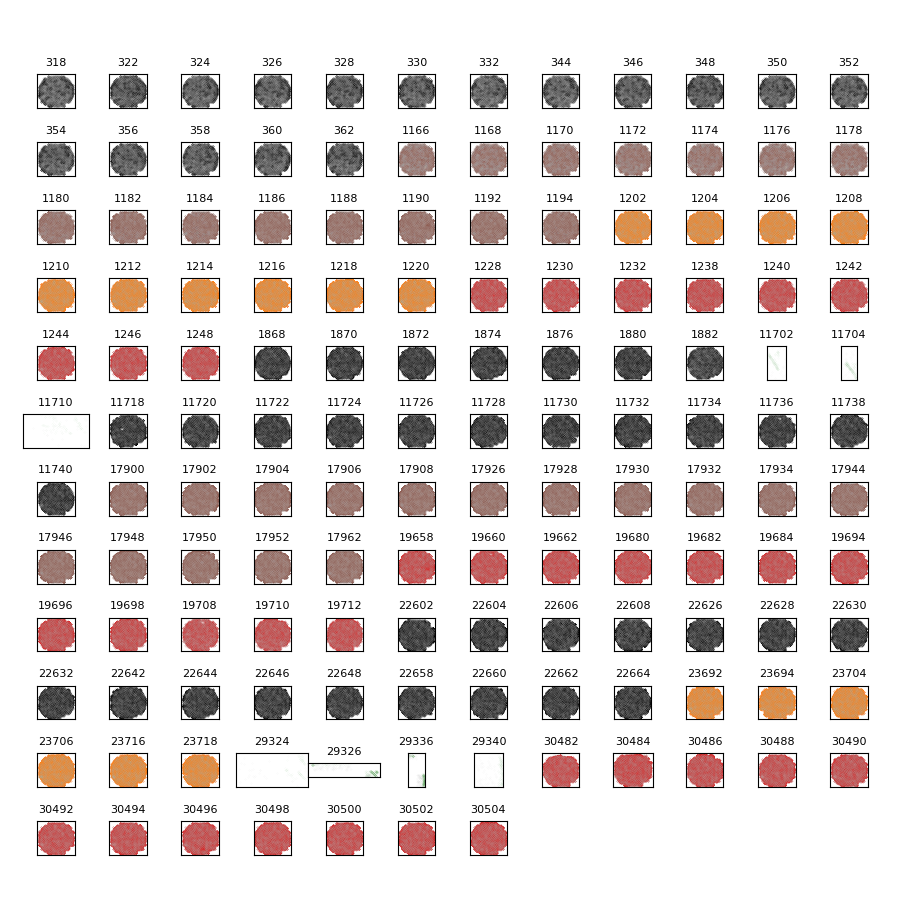

In [27]:
# Plot visit-by-visit: DIA Sources (blue) and inserted fakes (orange)

sourceTablePlot = srcTable

visits = np.unique(sourceTablePlot['visit'])
nVisits = len(visits)
if np.floor(np.sqrt(nVisits)) - np.sqrt(nVisits) == 0:
    squareGridSize = int(np.sqrt(nVisits))
else:
    squareGridSize = int(np.sqrt(nVisits)) + 1

fig = plt.figure(figsize=(9, 9))
for count, visit in enumerate(np.unique(sourceTablePlot['visit'].values)):
    band = sourceTablePlot.loc[(sourceTablePlot.visit == visit), 'filterName'].iloc[0]
    color = [colorList[0] if band==bandList[0] else 
             colorList[1] if band==bandList[1] else 
             colorList[2] if band==bandList[2] else 
             colorList[3] if band==bandList[3] else 
             colorList[4] if band==bandList[4] else 
             colorList[5]]
    idx = sourceTablePlot.visit == visit
    ax = fig.add_subplot(squareGridSize, squareGridSize, count + 1, aspect='equal')
    ax.scatter(sourceTablePlot.ra[idx], sourceTablePlot.decl[idx], c=color, marker='.', s=0.005, alpha=0.3)
    
    fakeSources = matchedDiaSources.loc[matchedDiaSources.visit == visit]
    ax.scatter(fakeSources.ra_x*u.rad.to(u.deg), fakeSources.dec*u.rad.to(u.deg),
               c='0.75', marker='.', s=0.02, alpha=0.3)
    
    ax.set_title(visit, size=8)
    ax.invert_xaxis()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    print(f'visit {visit}: {len(sourceTablePlot.loc[sourceTablePlot.visit == visit])} DIA Sources, {len(fakeSources)} matched injected fakes')

fig.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.subplots_adjust(wspace=0)

Text(0.5, 1.0, 'Stacked Visits, October2022')

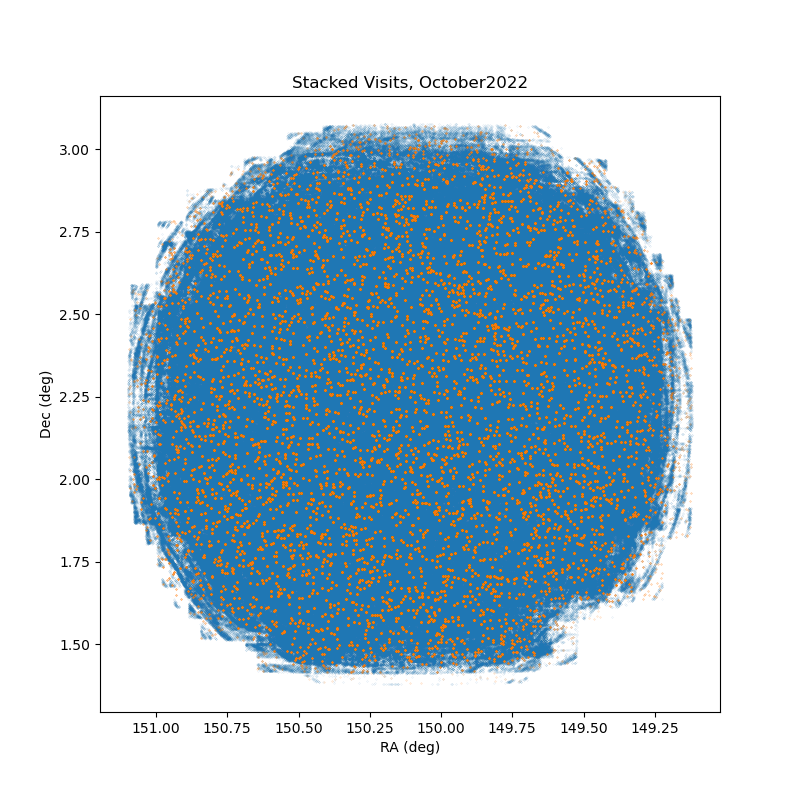

In [28]:
# Same as above but all on top of each other instead of broken out by visit
plt.figure(figsize=(8, 8))
plt.scatter(srcTable['ra'], srcTable['decl'],c='C0', s=0.01, alpha=0.5, label="COSMOS DIA Objects")
plt.scatter(matchedDiaSources.ra_x*u.rad.to(u.deg), matchedDiaSources.dec*u.rad.to(u.deg), c='C1', s=0.05, alpha=0.5, label="Fakes matched to DIA Sources")
plt.gca().invert_xaxis()
plt.xlabel('RA (deg)')
plt.ylabel('Dec (deg)')
plt.title(f'Stacked Visits, {month}{year}')

Text(0.5, 1.0, 'Comparing DIA Object and Source counts')

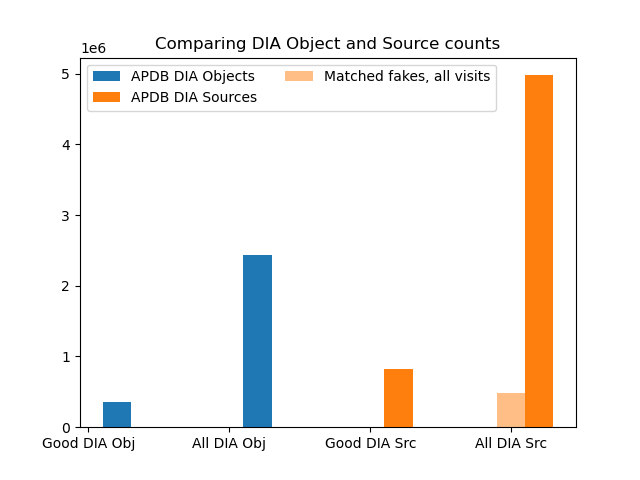

In [29]:
srcTable1 = matchedDiaSources
goodSrc1 = []

srcTable2 = srcTable
goodSrc2 = goodSrc
objTable2 = objTable
goodObj2 = goodObj

fig, ax = plt.subplots()
barLabels = ['Good DIA Obj', 'All DIA Obj', 'Good DIA Src', 'All DIA Src']
xbar = np.array([0, 1])
width = 0.2

# Current Run
ax.bar(xbar + width, [len(goodObj2), len(objTable2)], 
       width, label='APDB DIA Objects', color='C0')
ax.bar(xbar + 2 + width, [len(goodSrc2), len(srcTable2)],
       width, label='APDB DIA Sources', color='C1')
ax.bar(xbar + 2, [len(goodSrc1), len(srcTable1)],
       width, label='Matched fakes, all visits', color='C1', alpha=0.5)

plt.legend(ncol=2)
ax.set_xticks([0, 1, 2, 3])
labels = ax.set_xticklabels(barLabels)
plt.title('Comparing DIA Object and Source counts')

## 4. Fakes completeness analysis 

In [30]:
def completenessByBandPlot(matchedDiaSources, bandList, colorList, flux_col_suffix='_mag', doRaDecCut=False):

    completeness_byband = {}
    completeness_err_byband = {}
    bins = np.linspace(20, 26, 70)
    
    # Some filters
    wScienceOnly = matchedDiaSources['isVisitSource'] & ~matchedDiaSources['isTemplateSource']
    wMatched = matchedDiaSources['diaSourceId'] > 0
    
    if doRaDecCut:
        # Spatial cut  # probably redundant now that we do RA/Dec cut in trimFakes
        minra = matchedDiaSources.loc[wScienceOnly & wMatched,'ra'].min()
        maxra = matchedDiaSources.loc[wScienceOnly & wMatched,'ra'].max()
        mindecl = matchedDiaSources.loc[wScienceOnly & wMatched,'decl'].min()
        maxdecl = matchedDiaSources.loc[wScienceOnly & wMatched,'decl'].max()
        wRADec = (matchedDiaSources.ra < maxra) & (matchedDiaSources.ra > minra) & \
                 (matchedDiaSources.decl > mindecl) & (matchedDiaSources.decl < maxdecl)

    for band in bandList:
        wband = matchedDiaSources['filterName'] == band

        if doRaDecCut:
            matched_filter = (wMatched & wScienceOnly & wRADec & wband)
            unmatched_filter = (~wMatched & wScienceOnly & wRADec & wband)
        else:
            matched_filter = (wMatched & wScienceOnly &  wband)
            unmatched_filter = (~wMatched & wScienceOnly & wband)

        n_matched, edges = np.histogram(matchedDiaSources.loc[matched_filter, f'{band}{flux_col_suffix}'], bins=bins)
        n_unmatched, edges = np.histogram(matchedDiaSources.loc[unmatched_filter, f'{band}{flux_col_suffix}'], bins=bins)

        ntot = n_matched + n_unmatched
        nmatched_err = np.sqrt(n_matched)
        completeness_byband[band] = n_matched/ntot

        # Attempt to compute some kind of error
        ntot_err = np.sqrt(ntot) # compute on total to keep Poisson errors in gaussian regime
        completeness_err_byband[band] = completeness_byband[band] * \
                                        np.sqrt((nmatched_err/n_matched)**2. + (ntot_err/ntot)**2.)
    
    plt.figure()
    plt.title('Spatial distribution of matched DIA Sources')
    plt.scatter(matchedDiaSources.loc[wScienceOnly & wMatched,'ra'], \
                matchedDiaSources.loc[wScienceOnly & wMatched,'decl'],
                marker='x', s=3, label='Matched science fake')
    plt.scatter(matchedDiaSources.loc[wScienceOnly & ~wMatched,'ra'], \
                matchedDiaSources.loc[wScienceOnly & ~wMatched,'decl'],
                marker='.', s=3, label='Unmatched science fake')
    #plt.scatter(matchedDiaSources.loc[wScienceOnly & wRADec,'ra'], \
    #            matchedDiaSources.loc[wScienceOnly & wRADec,'decl'],marker='+')
    plt.legend()
    
    if len(bandList) > 1:
        fig, axs = plt.subplots(3, 2, figsize=(9, 12))
        axG = axs[0, 0]
        axR = axs[0, 1]
        axI = axs[1, 0]
        axZ = axs[1, 1]
        axY = axs[2, 0]
        #axHits = axs[2, 1]
        ax0 = axs[2, 1]
        ax0.axis('off')
        axList = [axG, axR, axI, axZ, axY]
        colorList = ['C2', 'C1', 'C3', 'C5', 'k']
        xlim = (20,26)
        ylim = (0, 1)
        plt.setp(axs, xlim=xlim, ylim=ylim)
        fig.suptitle(f'Completeness')
        for ax, band, color in zip(axList, bandList, colorList):
            ax.errorbar(bins[0:-1], completeness_byband[band], completeness_err_byband[band], color=color)
    
    plt.figure(figsize=(8, 6))
    for band, color in zip(bandList, colorList):
        plt.errorbar(bins[0:-1], completeness_byband[band], completeness_err_byband[band], color=color, label=band)
        #plt.axvline(median_limmag.loc[band,'maglim6'], color=color, ls=':')
        #plt.axvspan(p25_limmag.loc[band,'maglim6'], p75_limmag.loc[band,'maglim6'],
        #            facecolor=color, alpha=0.2, edgecolor='none')
    plt.axhline(.9, ls='--', color='0.75')#, label='90%')
    plt.legend(loc='lower left')
    plt.xlabel('Injected magnitude')
    plt.ylabel('Fractional completeness')
    plt.title('Completeness for sources injected into science (visit) images')

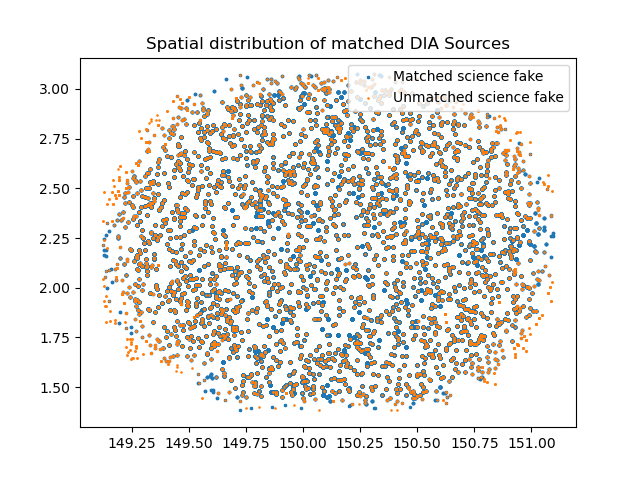

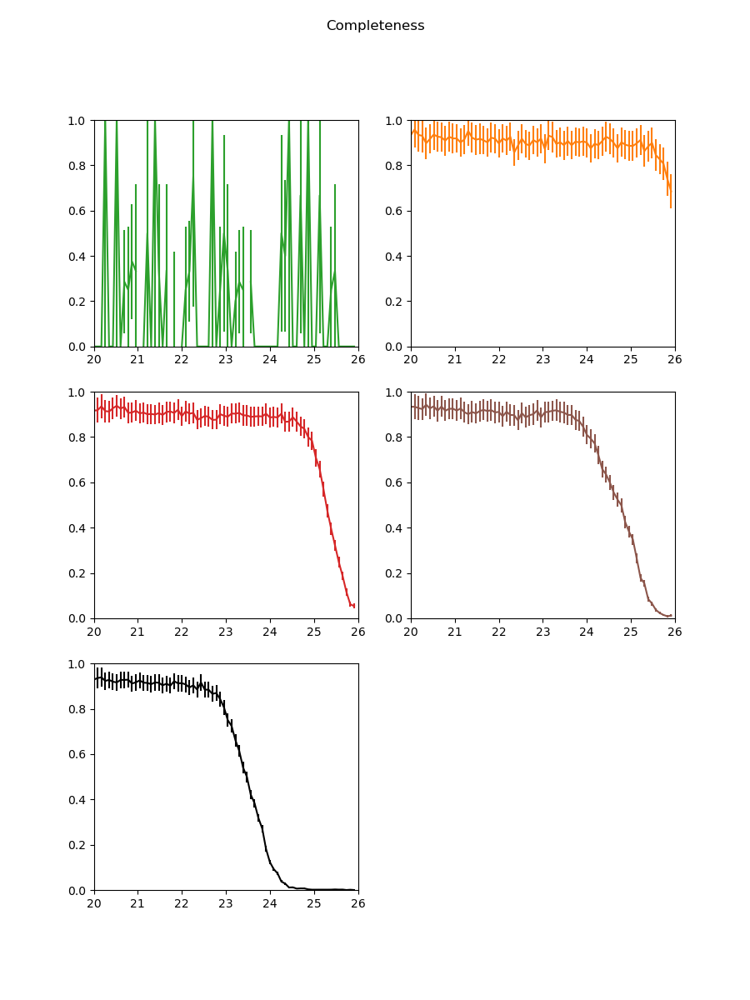

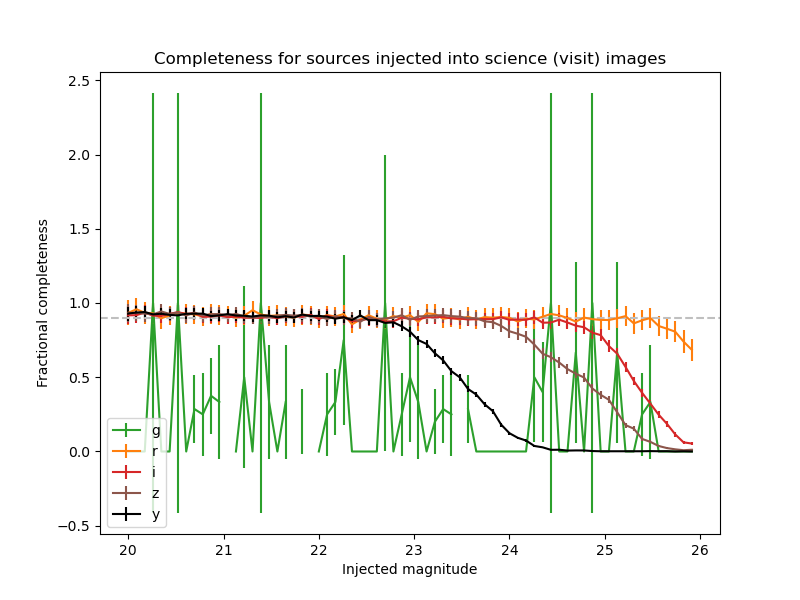

In [31]:
completenessByBandPlot(matchedDiaSources, bandList, colorList,
                       flux_col_suffix='_mag', doRaDecCut=False)

## 5. SNR distributions

For both difference image fluxes (psFlux) and forced source photometry fluxes (totFlux)
SNR is basically just flux/fluxErr for our purposes... but there is now an actual `snr` column in the DiaSource table too, even better!

(0.0, 10000.0)

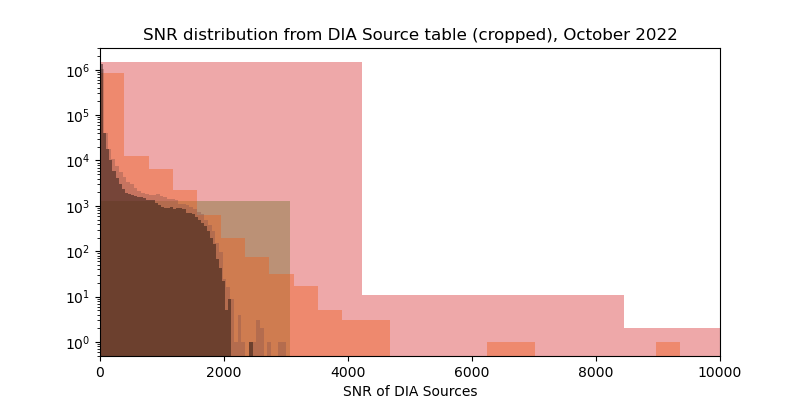

In [32]:
plt.figure(figsize=(8,4))
plt.yscale('log')
for band, color in zip(bandList, colorList):
    snrHist = plt.hist(srcTable.loc[srcTable.filterName==band, 'snr'], bins=50, color=color, alpha=0.4, label=band)
plt.title(f'SNR distribution from DIA Source table (cropped), {month} {year}')
plt.xlabel('SNR of DIA Sources')
plt.gca().set_xlim(0, 10000)

Text(0.5, 0, 'SNR of DIA Sources')

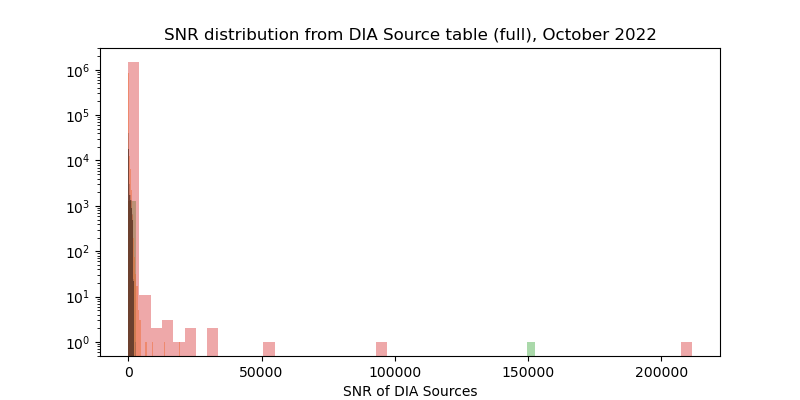

In [33]:
plt.figure(figsize=(8,4))
plt.yscale('log')
for band, color in zip(bandList, colorList):
    snrHist = plt.hist(srcTable.loc[srcTable.filterName==band, 'snr'], bins=50, color=color, alpha=0.4, label=band)
plt.title(f'SNR distribution from DIA Source table (full), {month} {year}')
plt.xlabel('SNR of DIA Sources')

In [34]:
# Pre-snr column:
srcTable['psFluxSNR'] = srcTable.psFlux / srcTable.psFluxErr
srcTable['totFluxSNR'] = srcTable.totFlux / srcTable.totFluxErr

Text(0.5, 0, 'psFlux/psFluxErr')

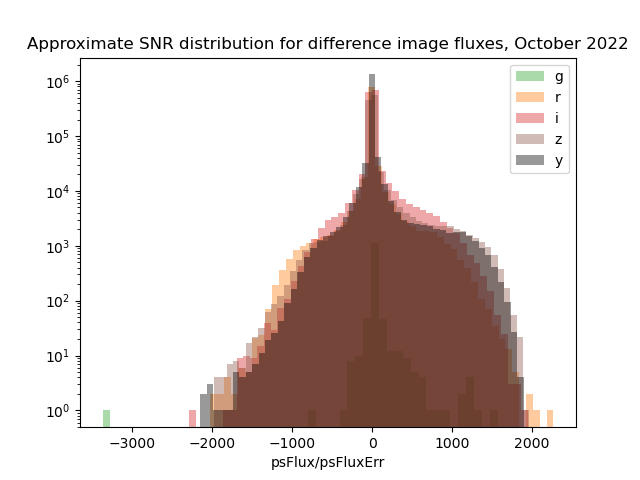

In [35]:
plt.figure()
plt.yscale('log')
for band, color in zip(bandList, colorList):
    psFluxHist = plt.hist(srcTable.loc[srcTable.filterName==band, 'psFluxSNR'], bins=50, color=color, alpha=0.4, label=band)
plt.legend()
plt.title(f'Approximate SNR distribution for difference image fluxes, {month} {year}')
plt.xlabel('psFlux/psFluxErr')

Text(0.5, 0, 'totFlux/totFluxErr')

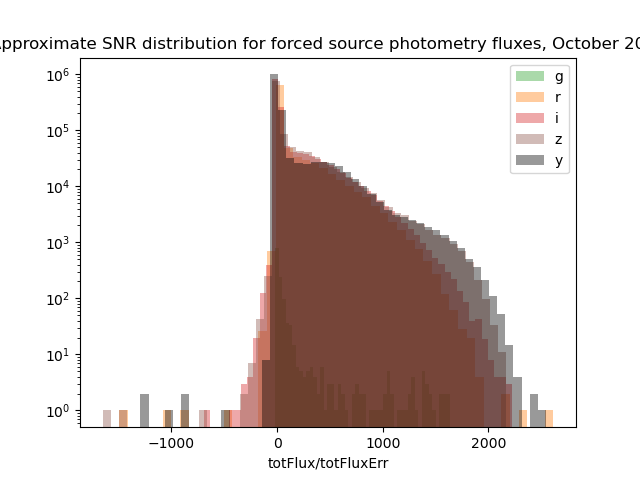

In [36]:
plt.figure()
plt.yscale('log')
for band, color in zip(bandList, colorList):
    totFluxHist = plt.hist(srcTable.loc[srcTable.filterName==band, 'totFluxSNR'], bins=50, color=color, alpha=0.4, label=band)
plt.legend()
plt.title(f'Approximate SNR distribution for forced source photometry fluxes, {month} {year}')
plt.xlabel('totFlux/totFluxErr')